In [1]:
import matplotlib
import matplotlib.pyplot as plt
import pysam
import pandas as pd
import numpy as np
import os
import collections
import ast
from pygenomeviz import GenomeViz

# Import DataFrames

In [2]:
newDF_HumanFinal = pd.read_csv("/home/mark/Desktop/HLA/C4_Master/Sample_Sequences_and_RepeatMasker/Combined_Human_Sample_RepeatMasker_50Percent_04-17-2024.csv").drop(columns=['Unnamed: 0'])

In [3]:
newDF_HumanFinal

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,11,11.2,6.9,0.0,hg38.hap7,3211657,3211685,(1393126),+,(CTTCTC)n,Simple_repeat,1,31,(0),4981,NaN
1,81,31.5,0.7,0.0,hg38.hap7,3212204,3212349,(1392462),+,MIR,SINE/MIR,2,148,(114),4982,*
2,340,27.4,7.9,3.5,hg38.hap7,3212338,3212612,(1392199),+,L1ME5,LINE/L1,5319,5608,(586),4983,NaN
3,340,9.5,0.0,0.3,hg38.hap7,3212613,3212916,(1391895),+,AluSc,SINE/Alu,1,303,(6),4984,NaN
4,340,27.4,7.9,3.5,hg38.hap7,3212921,3213388,(1391423),+,L1ME5,LINE/L1,5609,6094,(100),4983,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49755,60,30.9,18.6,0.0,HG03371.hap1,4093778,4093971,(2042617),C,MIRb,SINE/MIR,(24),244,15,6735,NaN
49756,290,8.4,9.8,0.0,HG03371.hap1,4094419,4094692,(2041896),+,AluSx4,SINE/Alu,2,302,(8),6736,NaN
49757,13,7.6,7.1,0.0,HG03371.hap1,4097838,4097865,(2038723),+,(CTGGG)n,Simple_repeat,1,30,(0),6737,NaN
49758,23,31.8,50.6,0.0,HG03371.hap1,4098066,4098219,(2038369),+,MIR,SINE/MIR,15,246,(16),6738,NaN


In [5]:
lengths = []
for row in newDF_HumanFinal.index:
    lengths.append(int(newDF_HumanFinal.at[row,'7'])-int(newDF_HumanFinal.at[row,'6']))
newDF_HumanFinal['Length']=lengths

# Start Visualization

In [6]:
ColorDict = {
 'DNA':'blue',
 'DNA/Crypton':'blue',
 'DNA/Crypton-A':'blue',
 'DNA/MULE-MuDR':'blue',
 'DNA/Merlin':'blue',
 'DNA/PIF-Harbinger':'blue',
 'DNA/PiggyBac':'blue',
 'DNA/TcMar':'blue',
 'DNA/TcMar-Mariner':'blue',
 'DNA/TcMar-Tc1':'blue',
 'DNA/TcMar-Tc2':'blue',
 'DNA/TcMar-Tigger':'blue',
 'DNA/hAT':'blue',
 'DNA/hAT-Ac':'blue',
 'DNA/hAT-Blackjack':'blue',
 'DNA/hAT-Charlie':'blue',
 'DNA/hAT-Tip100':'blue',
 'DNA/hAT-Tip100?':'blue',
 'DNA/hAT?':'blue',
 'LINE/CR1':'green',
 'LINE/L1':'green',
 'LINE/L2':'green',
 'LINE/RTE-X':'green',
 'LTR':'orange',
 'LTR/ERV1':'orange',
 'LTR/ERVK':'orange',
 'LTR/ERVL':'orange',
 'LTR/ERVL-MaLR':'orange',
 'LTR/Gypsy':'orange',
 'Low_complexity':'brown',
 'RC/Helitron':'brown',
 'Retroposon/SVA':'yellow',
 'SINE/Alu':'red',
 'SINE/MIR':'red',
 'SINE/tRNA':'red',
 'SINE/tRNA-RTE':'red',
 'Satellite':'silver',
 'Satellite/centr':'silver',
 'Satellite/subtelo':'silver',
 'Simple_repeat':'brown',
 'Unknown':'brown',
 'rRNA':'brown',
 'scRNA':'brown',
 'snRNA':'brown',
 'srpRNA':'brown',
 'tRNA':'brown'
}

In [7]:
humanColors= []
for row in newDF_HumanFinal.index:
    if 'Unspecified' in newDF_HumanFinal.at[row,'11'] and 'CYP21A2_EXON_' in newDF_HumanFinal.at[row,'10']:
        humanColors.append('#DF73FF')
    elif 'Unspecified' in newDF_HumanFinal.at[row,'11'] and 'C4' in newDF_HumanFinal.at[row,'10']:
        humanColors.append('#318CE7')
    elif 'Unspecified' in newDF_HumanFinal.at[row,'11'] and 'STK19' in newDF_HumanFinal.at[row,'10']:
        humanColors.append('#536878')
    elif 'Unspecified' in newDF_HumanFinal.at[row,'11'] and 'TNX' in newDF_HumanFinal.at[row,'10']:
        humanColors.append('#7FFF00')
    elif newDF_HumanFinal.at[row,'11'] in ColorDict.keys():
        humanColors.append(ColorDict[newDF_HumanFinal.at[row,'11']])
    else:
        print(row)        
newDF_HumanFinal['Color']=humanColors

In [8]:
newDF_HumanFinal['Insertion_Distance']='temp'

for sample in set([x for x in newDF_HumanFinal['5']]):
    tempDF = newDF_HumanFinal[newDF_HumanFinal['5']==sample].copy()
    tempDF['6']= tempDF['6'].astype(int)
    tempDF['7']= tempDF['7'].astype(int)
    start = int(min(tempDF['6']))
    
    for row in tempDF.index:
        newDF_HumanFinal.at[row,'Insertion_Distance']= (int(tempDF.at[row,'6'])-start)+10

In [9]:
genome_list = {}
for sample in set(newDF_HumanFinal['5']):
    
    tempDF = newDF_HumanFinal[newDF_HumanFinal['5']==sample].copy()
    tempDF['6']= tempDF['6'].astype(int)
    tempDF['7']= tempDF['7'].astype(int)

    size = abs(min(tempDF['6'])-max(tempDF['7']))

    genome_list[sample]={'name':sample, 'size':size+20, 'cds_list':[]}
    
    for item in tempDF.index:
        start = int(tempDF.at[item,'Insertion_Distance'])
        end = int(tempDF.at[item,'Insertion_Distance'])+int(tempDF.at[item,'Length'])
        if tempDF.at[item,'9'] == '+':
            strand = 1
        else:
            strand = -1
        genome_list[sample]['cds_list'].append([start, end, strand, str(tempDF.at[item,'10']), str(str(tempDF.at[item,'Color']))])


In [10]:
genome_list

{'NA19347.hap2': {'name': 'NA19347.hap2',
  'size': 148394,
  'cds_list': [[10, 38, 1, '(CTTCTC)n', 'brown'],
   [557, 702, 1, 'MIR', 'red'],
   [691, 965, 1, 'L1ME5', 'green'],
   [966, 1269, 1, 'AluSc', 'red'],
   [1274, 1741, 1, 'L1ME5', 'green'],
   [1728, 1828, 1, 'MIR', 'red'],
   [2219, 2530, -1, 'AluJb', 'red'],
   [2634, 2750, -1, 'MIR3', 'red'],
   [6649, 6688, 1, '(CTCCCTT)n', 'brown'],
   [8491, 8639, 1, 'STK19_EXON_1', '#536878'],
   [8749, 8885, 1, 'STK19_EXON_2', '#536878'],
   [9263, 9571, -1, 'L2', 'green'],
   [9640, 9804, -1, 'Charlie4z', 'blue'],
   [9897, 10053, 1, 'MER5B', 'blue'],
   [10054, 10133, -1, 'L2', 'green'],
   [10135, 10426, 1, 'AluSz6', 'red'],
   [10430, 10563, -1, 'L2', 'green'],
   [10564, 10910, 1, 'AluJr4', 'red'],
   [10913, 10973, -1, 'L2', 'green'],
   [11119, 11320, -1, 'L1ME3B', 'green'],
   [11330, 11628, -1, 'AluSc8', 'red'],
   [11632, 11730, -1, 'AluSq10', 'red'],
   [11731, 11782, 1, '(TT)n', 'brown'],
   [11783, 12781, -1, 'SVA_F', 'ye

In [11]:
import json
def js_r(filename: str):
    with open(filename) as f_in:
        return json.load(f_in)
my_sample_data = js_r('/home/mark/Desktop/HLA/Globus/sample_hap_HLA_Sequence_Dictionary.json')
sampleList = ['chm13.hap1','hg38.hap1']
for x in my_sample_data.keys():
    if 'unassigned' in x:
        continue
    else:
        sampleList.append(str(x.split(".")[0])+".hap"+str(x.split("hap")[1].split(".")[0]))
sampleList2 = sorted(sampleList)
metaData = pd.read_csv('/home/mark/Desktop/HLA/Globus/hgsvc_samples.tsv', sep='\t')
metaData.sort_values(by=['population'])
sampleList3 = ['chm13.hap1','hg38.hap1']
for x in metaData.sort_values(by=['population'])['sample']:
    if str(x)+".hap1" in sampleList2:
        sampleList3.append(str(x)+".hap1")
        sampleList3.append(str(x)+".hap2")
    else:
        continue

In [22]:
from dna_features_viewer import GraphicFeature, GraphicRecord

In [23]:
geneList=['C4A','CYP21A2','STK19B','STK19','TNXA','TNXB']
goodRows = []
for row in newDF_HumanFinal.index:
    if str(newDF_HumanFinal.at[row,'10'].split("_")[0]) in geneList:
        goodRows.append(row)
    else:
        continue
newDF_HumanFinal2 = newDF_HumanFinal.loc[goodRows].copy()

In [24]:
newDF_HumanFinal2[newDF_HumanFinal2['10'].str.contains("CYP", regex=True)]

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,Length,Color,Insertion_Distance
172,1626,0.9,0.0,0.0,hg38.hap7,3253456,3253665,(1351146),+,CYP21A2_EXON_1,Unspecified,1,210,(0),1940,NaN,209,#DF73FF,41809
175,757,0.0,0.0,0.0,hg38.hap7,3253763,3253852,(1350959),+,CYP21A2_EXON_2,Unspecified,1,90,(0),1941,NaN,89,#DF73FF,42116
177,1110,2.0,5.4,0.0,hg38.hap7,3254141,3254287,(1350524),+,CYP21A2_EXON_3,Unspecified,1,155,(0),1942,NaN,146,#DF73FF,42494
178,825,1.0,0.0,0.0,hg38.hap7,3254395,3254496,(1350315),+,CYP21A2_EXON_4,Unspecified,1,102,(0),1943,NaN,101,#DF73FF,42748
180,828,2.0,0.0,0.0,hg38.hap7,3254585,3254686,(1350125),+,CYP21A2_EXON_5,Unspecified,1,102,(0),1944,NaN,101,#DF73FF,42938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47884,721,0.0,0.0,0.0,HG03371.hap1,4019701,4019787,(2116801),+,CYP21A2_EXON_6,Unspecified,1,87,(0),2547,NaN,86,#DF73FF,69507
47898,1661,0.0,0.0,0.0,HG03371.hap1,4019957,4020157,(2116431),+,CYP21A2_EXON_7,Unspecified,1,201,(0),2548,NaN,200,#DF73FF,69763
47928,1418,0.0,0.0,0.0,HG03371.hap1,4020358,4020536,(2116052),+,CYP21A2_EXON_8,Unspecified,1,179,(0),2549,NaN,178,#DF73FF,70164
47942,862,0.0,0.0,0.0,HG03371.hap1,4020620,4020723,(2115865),+,CYP21A2_EXON_9,Unspecified,1,104,(0),2550,NaN,103,#DF73FF,70426


In [15]:
#newDF_HumanFinal2.to_csv("/home/mark/Desktop/HLA/C4_Master/Sample_Sequences_and_RepeatMasker/RCCX_Exons_4-23-2024.csv")

In [25]:
immunoAnnotDict = {}
directory='/home/mark/Desktop/HLA/HengLi/Runs/'
for file in os.listdir(directory):
    immunoAnnotDict[str(file.split(".")[0])+".hap"+str(file.split(".")[1])]={}
    dfIA = pd.read_csv(directory+file, comment='#', sep='\t', header=None)
    dfIA2 = dfIA[dfIA[2]=='gene'].copy()
    for row in dfIA2.index:
        if 'C4' in dfIA2.at[row,8]:
            geneName = ast.literal_eval(str(dfIA2.at[row,8].split("gene_name ")[1].split(";")[0]))
            start=str(dfIA2.at[row,3])
            end=str(dfIA2.at[row,4])
            immunoAnnotDict[str(file.split(".")[0])+".hap"+str(file.split(".")[1])][str(start)+"-"+str(end)]=geneName
        else:
            continue
immunoAnnotDict

{'HG02666.hap2': {'3940103-3960726': 'C4AL', '3972840-3987095': 'C4BS'},
 'HG02059.hap2': {'3850294-3870917': 'C4AL', '3883032-3903655': 'C4BL'},
 'NA18534.hap1': {'3854619-3875242': 'C4AL', '3887356-3907978': 'C4BL'},
 'NA19240.hap1': {'3918864-3939487': 'C4AL', '3951602-3965857': 'C4BS'},
 'NA19317.hap1': {'3814714-3835338': 'C4AL', '3847453-3861708': 'C4BS'},
 'HG02818.hap1': {'3935403-3956026': 'C4AL', '3968141-3982396': 'C4BS'},
 'HG03683.hap2': {'3826620-3847244': 'C4AL', '3859360-3873615': 'C4BS'},
 'NA24385.hap1': {'3818761-3839384': 'C4AL', '3851499-3872122': 'C4BL'},
 'NA19836.hap1': {'3777967-3798591': 'C4AL', '3810706-3824961': 'C4BS'},
 'NA21487.hap1': {'3916600-3937224': 'C4AL', '3949338-3963593': 'C4BS'},
 'HG03683.hap1': {'3819031-3839654': 'C4AL',
  '3851769-3872392': 'C4BL',
  '3884507-3905130': 'C4BL'},
 'HG01890.hap1': {'3930469-3951093': 'C4AL', '3963208-3977463': 'C4BS'},
 'HG03456.hap2': {'3902526-3923150': 'C4AL', '3935265-3949520': 'C4BS'},
 'chm13.hap1': {'383

In [16]:
#with open('/home/mark/Desktop/C4_longSequences.fasta', 'a+') as file:
#    for sample in immunoAnnotDict.keys():
#        sampleName=str(sample.split(".")[0])
#        haplotype = str(sample.split(".")[1])
#        if 'chm13' in sampleName or 'hg38' in sampleName:
#            continue
#        else:
#            for geneCoordinates in immunoAnnotDict[sample]:
#                file.write(">"+str(sample)+":"+str(geneCoordinates)+"_"+str(immunoAnnotDict[sample][geneCoordinates])+"\n")
#                sequence = ''.join(pysam.faidx('/home/mark/Desktop/HLA/Globus/cleaned/'+str(sampleName)+'.vrk-ps-sseq.asm-'+str(haplotype)+'.HLA.cleaned.fasta', sample+":"+geneCoordinates).split()[1:])
#                file.write(sequence+"\n")
#file.close()
        

In [26]:
def findGeneCounts(df, gene, exonCountsdict, ExonOrientationdict):
    
    tempDF2 = df[df['10'].str.contains(gene, regex=True)]
    orientation = ExonOrientationdict[gene]
    exonCountCut = exonCountsdict[gene]
    tempDict={}
    i=1
    
    
    tempList=[]
    for row in tempDF2.index:
        if orientation == 'C':
            
            if str(gene)+"EXON_1" == str(tempDF2.at[row,'10']):
                tempList.append(row)
                tempDict[i]=tempList
                i+=1
                tempList=[]
            else:
                tempList.append(row)
                
        else:
            
            if str(gene)+'EXON_'+str(exonCountCut) == str(tempDF2.at[row,'10']):
                tempList.append(row)
                tempDict[i]=tempList
                i+=1
                tempList=[]
            else:
                tempList.append(row)
                
    tempDict2={}
    for key in tempDict.keys():
        geneDF = df.loc[tempDict[key]].copy()
        tempDict2[key]={'OriginalStart':min([x for x in geneDF['6']]), 'OriginalEnd':max([x for x in geneDF['7']]), 'Start':min([x for x in geneDF['NewStart']]), 'End':max([x for x in geneDF['NewEnd']]), 'Orientation':orientation}
        
        
        
    return(tempDict2)

In [27]:
TNXBDict = {}
with open('/home/mark/Desktop/HLA/C4_Master/Sample_Sequences_and_RepeatMasker/jupyterFasta/TNXB_Sequences_04-17-2024_RC.translated.afa', 'r') as inFile:
    for line in inFile:
        if '>' in str(line):
            sample = str(line.split(">")[1].split(":")[0])
            coordinates = str(line.split(">")[1].split(":")[1])
            if sample in TNXBDict.keys():
                if '_NF_' in str(coordinates):
                    TNXBDict[sample][coordinates.split("_")[0].strip()]='TNXB:NF'
                else:
                    TNXBDict[sample][coordinates.strip()]='TNXB'
            else:
                TNXBDict[sample]={}
                if '_NF' in str(coordinates):
                    TNXBDict[sample][coordinates.split("_")[0].strip()]='TNXB:NF'
                else:
                    TNXBDict[sample][coordinates.strip()]='TNXB'                
        else:
            continue
inFile.close()

In [28]:
TNXBDict

{'HG01573.hap1': {'3802486-3870660': 'TNXB'},
 'NA20509.hap1': {'3900180-3968365': 'TNXB'},
 'NA19983.hap1': {'3903840-3972025': 'TNXB'},
 'HG01573.hap2': {'3909035-3977214': 'TNXB'},
 'HG03452.hap1': {'3923311-3991498': 'TNXB'},
 'NA19434.hap2': {'3938129-4006314': 'TNXB'},
 'NA21487.hap1': {'3969327-4037514': 'TNXB'},
 'NA19331.hap1': {'3917247-3985433': 'TNXB'},
 'HG02818.hap2': {'3901268-3969458': 'TNXB'},
 'HG02953.hap2': {'3911243-3979435': 'TNXB'},
 'NA19036.hap2': {'3927045-3995234': 'TNXB'},
 'NA19238.hap2': {'3905357-3973546': 'TNXB'},
 'NA24385.hap1': {'3877857-3946042': 'TNXB'},
 'HG04036.hap2': {'3897599-3965784': 'TNXB'},
 'NA19036.hap1': {'3924734-3992928': 'TNXB'},
 'NA20355.hap1': {'3911763-3979964': 'TNXB'},
 'HG03732.hap2': {'3906168-3974344': 'TNXB'},
 'HG04217.hap2': {'3926996-3995170': 'TNXB'},
 'HG01505.hap1': {'3899542-3967717': 'TNXB'},
 'HG00864.hap2': {'3915550-3983804': 'TNXB'},
 'HG03456.hap2': {'3955255-4023443': 'TNXB'},
 'HG03248.hap2': {'3991119-4059319

In [29]:
CYP21A2Dict = {}
with open('/home/mark/Desktop/HLA/C4_Master/Sample_Sequences_and_RepeatMasker/jupyterFasta/CYP21A2_Pseudogenes.fasta', 'r') as inFile:
    for line in inFile:
        if '>' in str(line):
            sample = str(line.split(">")[1].split(":")[0])
            coordinates = str(line.split(">")[1].split(":")[1])
            if sample in CYP21A2Dict.keys():
                CYP21A2Dict[sample][coordinates.strip()]='CYP21A1P'
            else:
                CYP21A2Dict[sample]={}
                CYP21A2Dict[sample][coordinates.strip()]='CYP21A1P'
                
        else:
            continue
inFile.close()

with open('/home/mark/Desktop/HLA/C4_Master/Sample_Sequences_and_RepeatMasker/jupyterFasta/CYP21A2_Sequences_04-11-2024_alignments.translated_ForJupyter_ProteinCoding.fasta', 'r') as inFile:
    for line in inFile:
        if '>' in str(line):
            sample = str(line.split(">")[1].split(":")[0])
            coordinates = str(line.split(">")[1].split(":")[1])
            if sample in CYP21A2Dict.keys():
                if '_NF' in str(coordinates):
                    CYP21A2Dict[sample][coordinates.split("_")[0].strip()]='CYP21A2:NF'
                else:
                    CYP21A2Dict[sample][coordinates.split("_")[0].strip()]='CYP21A2'

            else:
                CYP21A2Dict[sample]={}
                CYP21A2Dict[sample][coordinates.split("_")[0].strip()]='CYP21A2'
                
        else:
            continue
inFile.close()

In [40]:
exportGeneNameDictionary

{'chm13.hap1': {1: {'start': 3835264,
   'end': 3855888,
   'strand': 1,
   'label': 'C4AL'},
  2: {'start': 3868002, 'end': 3888626, 'strand': 1, 'label': 'C4BL'},
  3: {'start': 3858888, 'end': 3862116, 'strand': 1, 'label': 'CYP21A1P'},
  4: {'start': 3891623, 'end': 3894849, 'strand': 1, 'label': 'CYP21A2'},
  5: {'start': 3866427, 'end': 3866994, 'strand': 1, 'label': 'STK19B'},
  6: {'start': 3825569, 'end': 3834653, 'strand': 1, 'label': 'STK19'},
  7: {'start': 3861821, 'end': 3865679, 'strand': -1, 'label': 'TNXA'},
  8: {'start': 3894358, 'end': 3962531, 'strand': -1, 'label': 'TNXB'}},
 'hg38.hap1': {1: {'start': 3471938,
   'end': 3492562,
   'strand': 1,
   'label': 'C4AL'},
  2: {'start': 3504676, 'end': 3525299, 'strand': 1, 'label': 'C4BL'},
  3: {'start': 3495562, 'end': 3498790, 'strand': 1, 'label': 'CYP21A1P'},
  4: {'start': 3528296, 'end': 3531525, 'strand': 1, 'label': 'CYP21A2'},
  5: {'start': 3503101, 'end': 3503668, 'strand': 1, 'label': 'STK19B'},
  6: {'sta

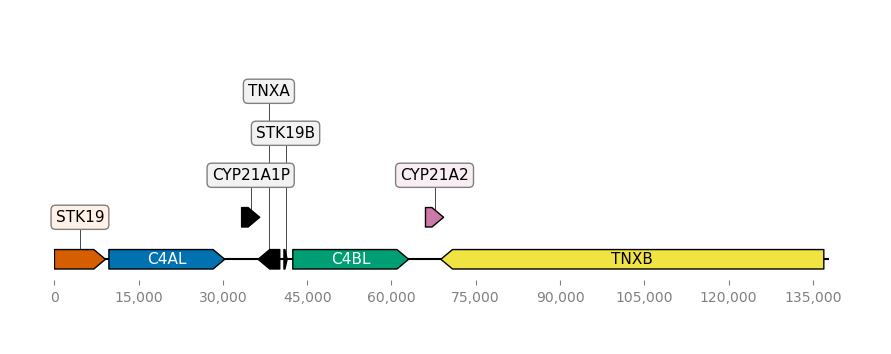

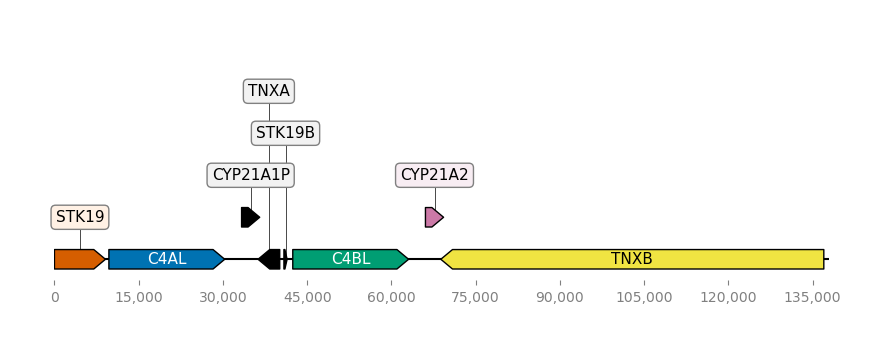

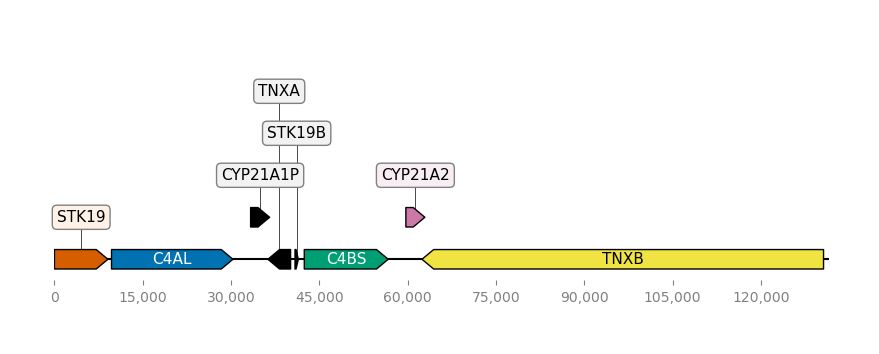

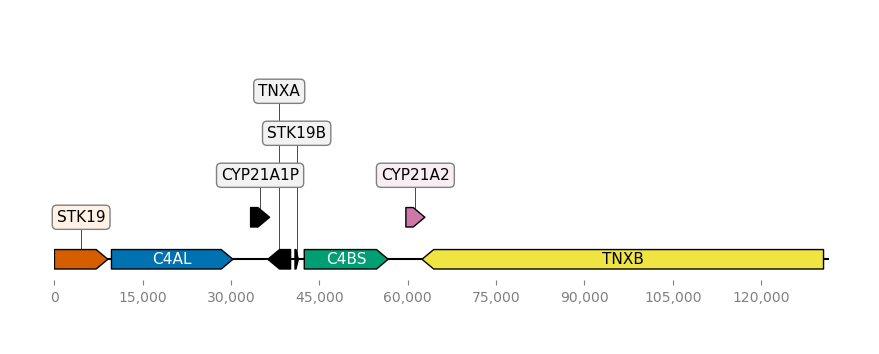

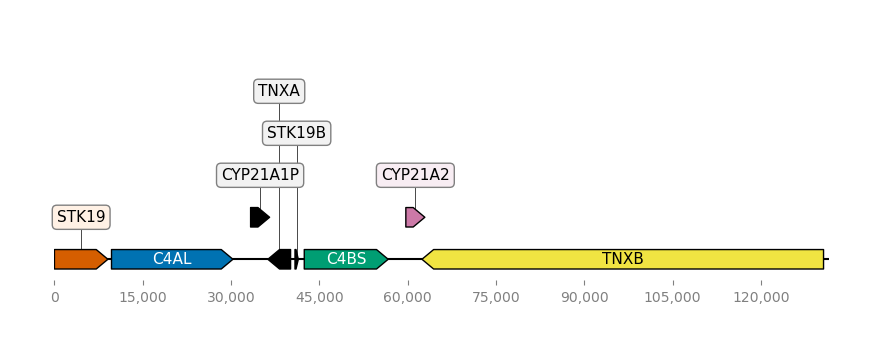

...

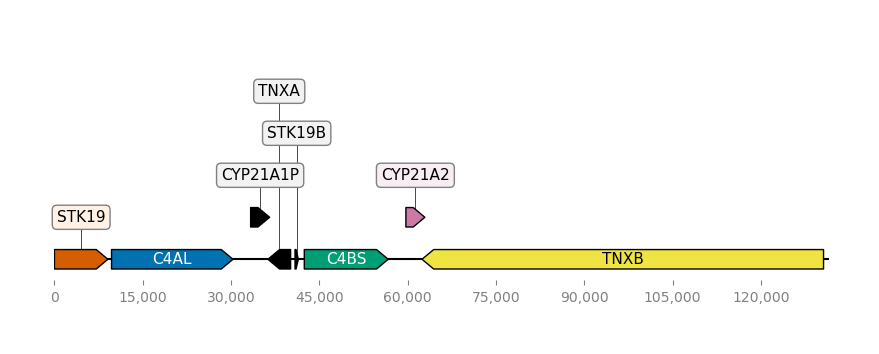

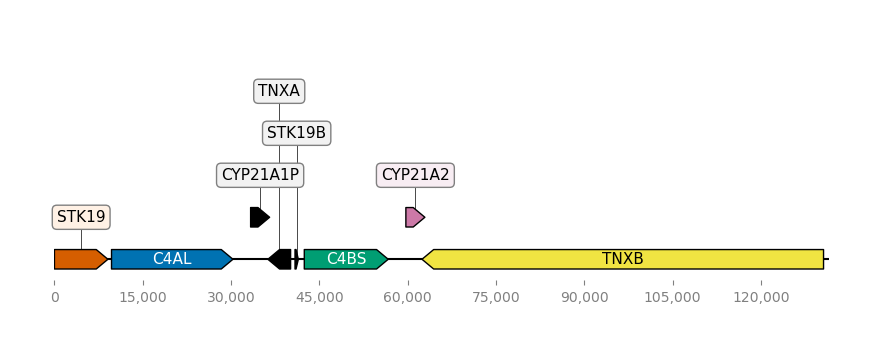

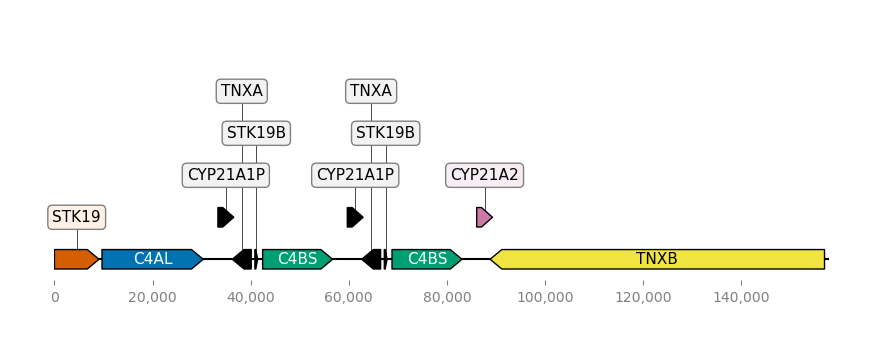

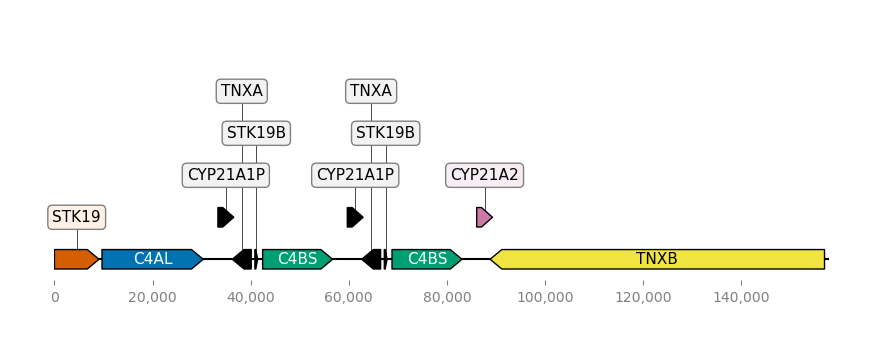

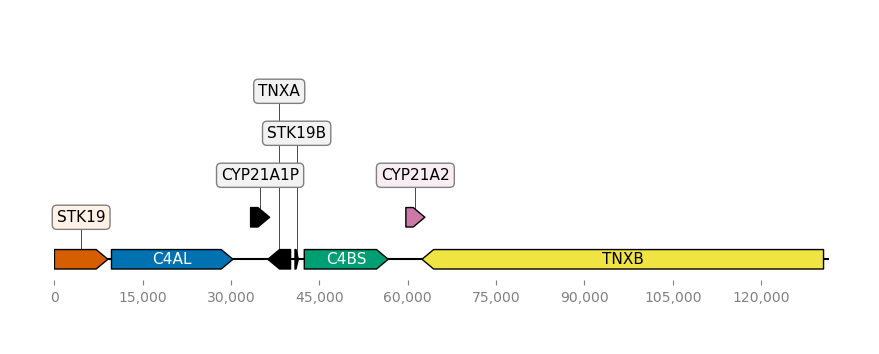

In [30]:
import matplotlib.pyplot as plt
geneList=['C4A_','CYP21A2_','STK19B_','STK19_','TNXA_','TNXB_']
ExonCount = {'C4A_':41,'CYP21A2_':10,'STK19B_':3,'STK19_':7,'TNXA_':13,'TNXB_':44}
ExonOrientation = {'C4A_':'+','CYP21A2_':'+','STK19B_':'+','STK19_':'+','TNXA_':'C','TNXB_':'C'}
geneColors = {'C4BL':'#009E73','C4BS':'#009E73','C4AL':'#0072B2','C4AS':'#0072B2','CYP21A1P':'#000000','CYP21A2:NF':'#000000','CYP21A2':'#CC79A7','STK19B':'#000000','STK19':'#D55E00','TNXA':'#000000','TNXB:NF':'#000000','TNXB':'#F0E442'}
shortList=['HG01352.hap2','chm13.hap1','HG01890.hap1','HG02554.hap2','HG02011.hap2','NA19705.hap1','NA19836.hap2','HG00864.hap2','HG00514.hap2','HG01352.hap1','HG01114.hap2','NA20847.hap1','NA20847.hap2','HG03248.hap1','NA18939.hap2','NA19331.hap1','NA19434.hap1','HG01573.hap2','HG04036.hap1']
sampleDictionary_Seq={}
exportGeneNameDictionary={}
for sample in sampleList3:
    i=1
    exportGeneNameDictionary[sample]={}

    
    features=[]
    
    tempDF = newDF_HumanFinal2[newDF_HumanFinal2['5']==sample].copy()
    startCoordinate = min([x for x in tempDF['6']])
    startCoordinateList=[]
    endCoordinateList=[]
    
    for row in tempDF.index:
        startCoordinateList.append(int(tempDF.at[row,'6'])-startCoordinate)
        endCoordinateList.append(int(tempDF.at[row,'7'])-startCoordinate)
        
    tempDF['NewStart']=startCoordinateList
    tempDF['NewEnd']=endCoordinateList
    
    
    for gene in geneList:
        #print(gene)
        
        geneDict = findGeneCounts(tempDF, gene, ExonCount,ExonOrientation)
        
        #Test to see what the label should be
        for geneHit in geneDict.keys():
            
            #Figure out the orientation
            if geneDict[geneHit]['Orientation'] == '+':
                thestrand = 1
            else:
                thestrand = -1   
                
            #Now test for specific genes    
            if str(gene) == 'C4A_':

                geneStart = int(geneDict[geneHit]['OriginalStart'])
                geneEnd = int(geneDict[geneHit]['OriginalEnd'])
                
                for iagene in immunoAnnotDict[sample]:
                    
                    x = range(geneStart,geneEnd)
                    y = range(int(iagene.split("-")[0]),int(iagene.split("-")[1]))
                    xs = set(x)
                    if len(xs.intersection(y))>0:
                        mylabel=str(immunoAnnotDict[sample][iagene])
                    else:
                        continue
                #print('mylabel', mylabel)
            
            elif str(gene) == 'TNXB_':

                geneStart = int(geneDict[geneHit]['OriginalStart'])
                geneEnd = int(geneDict[geneHit]['OriginalEnd'])
                
                for iagene in TNXBDict[sample].keys():
                    
                    x = range(geneStart,geneEnd)
                    y = range(int(iagene.split("-")[0]),int(iagene.split("-")[1]))
                    xs = set(x)
                    if len(xs.intersection(y))>0:
                        mylabel=str(TNXBDict[sample][iagene])
                    else:
                        continue
            
            
            elif str(gene) == 'CYP21A2_':

                geneStart = int(geneDict[geneHit]['OriginalStart'])
                geneEnd = int(geneDict[geneHit]['OriginalEnd'])
                
                for iagene in CYP21A2Dict[sample].keys():
                    
                    x = range(geneStart,geneEnd)
                    y = range(int(iagene.split("-")[0]),int(iagene.split("-")[1]))
                    xs = set(x)
                    if len(xs.intersection(y))>0:
                        mylabel=str(CYP21A2Dict[sample][iagene])
                    else:
                        continue
                #print('mylabel', mylabel)
            else:
                mylabel=str(gene.split("_")[0])
                #print('mylabel', mylabel)
                
                
            colorCode=geneColors[mylabel]
            
            exportGeneNameDictionary[sample][i]={'start':geneDict[geneHit]['OriginalStart'], 'end':geneDict[geneHit]['OriginalEnd'], 'strand':thestrand, 'label':mylabel}            
            i+=1
            features.append(GraphicFeature(start=geneDict[geneHit]['Start'], end=geneDict[geneHit]['End'], strand=thestrand, color=colorCode, label=mylabel))
    #print(features)
    record = GraphicRecord(sequence_length=max(tempDF['NewEnd'])+1000, features=features)
    tempList = []
    for feat in features:
        start=int(str(feat).split()[1].split("-")[0])
        end=int(str(feat).split()[1].split("-")[1])
        name=str(feat).split()[0].split("(")[1].split(",")[0]
        tempList.append([name,start,end])
    tempDF = pd.DataFrame(data=tempList, columns=['Names','Start','End'])
    sequence = '_'.join([x for x in tempDF.sort_values(by='Start')['Names']])
    sampleDictionary_Seq[sample]=sequence
    ax, _ = record.plot(figure_width=10)
    #ax.figure.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Architecture/'+str(sample)+"_RCCX.svg", bbox_inches='tight')

In [31]:
features

[GF(C4AL, 9686-30311 (1)),
 GF(C4BS, 42424-56680 (1)),
 GF(CYP21A1P, 33310-36538 (1)),
 GF(CYP21A2, 59676-62905 (1)),
 GF(STK19B, 40849-41416 (1)),
 GF(STK19, 0-9075 (1)),
 GF(TNXA, 36243-40101 (-1)),
 GF(TNXB, 62414-130603 (-1))]

In [32]:
geneDict

{1: {'OriginalStart': 3905357,
  'OriginalEnd': 3973546,
  'Start': 62414,
  'End': 130603,
  'Orientation': 'C'}}

In [28]:
import json
#with open('/home/mark/Desktop/HLA/C4_Master/RCCX_Gene_Coordinate_04-23-2024.json', 'w') as fp:
#    json.dump(exportGeneNameDictionary, fp)

In [29]:
#with open('/home/mark/Desktop/HLA/C4_Master/RCCX_GeneProfiles_04-23-2024.json', 'w') as fp:
#    json.dump(sampleDictionary_Seq, fp)

In [33]:
import collections
seqTotalRCCX = collections.Counter([y for y in sampleDictionary_Seq.values()])
print(len(seqTotalRCCX))

19


In [36]:
immunoAnnotDict

{'HG02666.hap2': {'3940103-3960726': 'C4AL', '3972840-3987095': 'C4BS'},
 'HG02059.hap2': {'3850294-3870917': 'C4AL', '3883032-3903655': 'C4BL'},
 'NA18534.hap1': {'3854619-3875242': 'C4AL', '3887356-3907978': 'C4BL'},
 'NA19240.hap1': {'3918864-3939487': 'C4AL', '3951602-3965857': 'C4BS'},
 'NA19317.hap1': {'3814714-3835338': 'C4AL', '3847453-3861708': 'C4BS'},
 'HG02818.hap1': {'3935403-3956026': 'C4AL', '3968141-3982396': 'C4BS'},
 'HG03683.hap2': {'3826620-3847244': 'C4AL', '3859360-3873615': 'C4BS'},
 'NA24385.hap1': {'3818761-3839384': 'C4AL', '3851499-3872122': 'C4BL'},
 'NA19836.hap1': {'3777967-3798591': 'C4AL', '3810706-3824961': 'C4BS'},
 'NA21487.hap1': {'3916600-3937224': 'C4AL', '3949338-3963593': 'C4BS'},
 'HG03683.hap1': {'3819031-3839654': 'C4AL',
  '3851769-3872392': 'C4BL',
  '3884507-3905130': 'C4BL'},
 'HG01890.hap1': {'3930469-3951093': 'C4AL', '3963208-3977463': 'C4BS'},
 'HG03456.hap2': {'3902526-3923150': 'C4AL', '3935265-3949520': 'C4BS'},
 'chm13.hap1': {'383

In [38]:
TNXBDict

{'HG01573.hap1': {'3802486-3870660': 'TNXB'},
 'NA20509.hap1': {'3900180-3968365': 'TNXB'},
 'NA19983.hap1': {'3903840-3972025': 'TNXB'},
 'HG01573.hap2': {'3909035-3977214': 'TNXB'},
 'HG03452.hap1': {'3923311-3991498': 'TNXB'},
 'NA19434.hap2': {'3938129-4006314': 'TNXB'},
 'NA21487.hap1': {'3969327-4037514': 'TNXB'},
 'NA19331.hap1': {'3917247-3985433': 'TNXB'},
 'HG02818.hap2': {'3901268-3969458': 'TNXB'},
 'HG02953.hap2': {'3911243-3979435': 'TNXB'},
 'NA19036.hap2': {'3927045-3995234': 'TNXB'},
 'NA19238.hap2': {'3905357-3973546': 'TNXB'},
 'NA24385.hap1': {'3877857-3946042': 'TNXB'},
 'HG04036.hap2': {'3897599-3965784': 'TNXB'},
 'NA19036.hap1': {'3924734-3992928': 'TNXB'},
 'NA20355.hap1': {'3911763-3979964': 'TNXB'},
 'HG03732.hap2': {'3906168-3974344': 'TNXB'},
 'HG04217.hap2': {'3926996-3995170': 'TNXB'},
 'HG01505.hap1': {'3899542-3967717': 'TNXB'},
 'HG00864.hap2': {'3915550-3983804': 'TNXB'},
 'HG03456.hap2': {'3955255-4023443': 'TNXB'},
 'HG03248.hap2': {'3991119-4059319

In [39]:
CYP21A2Dict

{'HG01114.hap2': {'3847461-3850687': 'CYP21A1P'},
 'HG03248.hap1': {'3974986-3978212': 'CYP21A1P',
  '3942248-3945474': 'CYP21A1P',
  '4001354-4004581': 'CYP21A2'},
 'NA19036.hap1': {'3895630-3898856': 'CYP21A1P', '3921996-3925223': 'CYP21A2'},
 'HG00358.hap2': {'3853098-3856324': 'CYP21A1P',
  '3879469-3882695': 'CYP21A1P',
  '3912223-3915450': 'CYP21A2'},
 'HG00864.hap2': {'3853706-3856933': 'CYP21A1P',
  '3880078-3883304': 'CYP21A1P',
  '3912812-3916039': 'CYP21A2'},
 'NA19238.hap2': {'3876253-3879479': 'CYP21A1P', '3902619-3905846': 'CYP21A2'},
 'NA18939.hap1': {'3944841-3948067': 'CYP21A1P',
  '3971211-3974437': 'CYP21A1P',
  '4003945-4007172': 'CYP21A2'},
 'HG02953.hap2': {'3882139-3885365': 'CYP21A1P', '3908505-3911732': 'CYP21A2'},
 'HG01890.hap2': {'3846471-3849697': 'CYP21A1P', '3872839-3876066': 'CYP21A2'},
 'HG02282.hap1': {'3870378-3873604': 'CYP21A1P', '3896746-3899973': 'CYP21A2'},
 'NA20355.hap1': {'3882659-3885885': 'CYP21A1P', '3909025-3912252': 'CYP21A2'},
 'HG02818.

In [34]:
sampleDictionary_Seq

{'chm13.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'hg38.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'HG01890.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG01890.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG02554.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG02554.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4AS_CYP21A2_TNXB',
 'HG02011.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'HG02011.hap2': 'STK19_C4BS_CYP21A2_TNXB',
 'HG02282.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG02282.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'NA24385.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'NA24385.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'NA19705.hap1': 'STK19_C4AL_CYP21A2_TNXB',
 'NA19705.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'NA19983.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'NA199

In [41]:
exportGeneNameDictionary

{'chm13.hap1': {1: {'start': 3835264,
   'end': 3855888,
   'strand': 1,
   'label': 'C4AL'},
  2: {'start': 3868002, 'end': 3888626, 'strand': 1, 'label': 'C4BL'},
  3: {'start': 3858888, 'end': 3862116, 'strand': 1, 'label': 'CYP21A1P'},
  4: {'start': 3891623, 'end': 3894849, 'strand': 1, 'label': 'CYP21A2'},
  5: {'start': 3866427, 'end': 3866994, 'strand': 1, 'label': 'STK19B'},
  6: {'start': 3825569, 'end': 3834653, 'strand': 1, 'label': 'STK19'},
  7: {'start': 3861821, 'end': 3865679, 'strand': -1, 'label': 'TNXA'},
  8: {'start': 3894358, 'end': 3962531, 'strand': -1, 'label': 'TNXB'}},
 'hg38.hap1': {1: {'start': 3471938,
   'end': 3492562,
   'strand': 1,
   'label': 'C4AL'},
  2: {'start': 3504676, 'end': 3525299, 'strand': 1, 'label': 'C4BL'},
  3: {'start': 3495562, 'end': 3498790, 'strand': 1, 'label': 'CYP21A1P'},
  4: {'start': 3528296, 'end': 3531525, 'strand': 1, 'label': 'CYP21A2'},
  5: {'start': 3503101, 'end': 3503668, 'strand': 1, 'label': 'STK19B'},
  6: {'sta

In [56]:
assemblyCut = pd.read_csv('/home/mark/Desktop/HLA/Globus/assembly_cut_table.tsv',sep='\t')
assemblyCut['Hap']='temp'
for row in assemblyCut.index:
    if 'haplotype1' in str(assemblyCut.at[row,'query']):
        haplo = 'hap1'
    else:
        haplo = 'hap2'
    assemblyCut.at[row,'Hap']=str(assemblyCut.at[row,'sample'].split(".")[0])+"."+str(haplo)

In [57]:
assemblyCut.set_index("Hap", inplace=True)

In [58]:
assemblyCut

,sample,query,query_start,query_end,query_orientation,target_start,target_end,cut_query_begin,cut_query_end,cut_length,source_assembly,source_file
Hap,,,,,,,,,,,,
HG00096.hap1,HG00096.vrk-ps-sseq,haplotype1-0000024,15648036,59014324,1,15539817,58769294,28108219,34245030,6136811,HG00096.vrk-ps-sseq.asm-hap1,HG00096.vrk-ps-sseq.asm-hap1.t2tv2.norm-paf.ts...
HG00096.hap2,HG00096.vrk-ps-sseq,haplotype2-0000117,26730012,58944173,1,26628573,58869712,28101439,34074461,5973022,HG00096.vrk-ps-sseq.asm-hap2,HG00096.vrk-ps-sseq.asm-hap2.t2tv2.norm-paf.ts...
HG00171.hap1,HG00171.vrk-ps-sseq,haplotype1-0000033,113988286,156019314,-1,16822354,58757745,138746031,144841668,6095637,HG00171.vrk-ps-sseq.asm-hap1,HG00171.vrk-ps-sseq.asm-hap1.t2tv2.norm-paf.ts...
HG00171.hap2,HG00171.vrk-ps-sseq,haplotype2-0000168,120504671,145333990,-1,26628573,51329071,137833742,143962563,6128821,HG00171.vrk-ps-sseq.asm-hap2,HG00171.vrk-ps-sseq.asm-hap2.t2tv2.norm-paf.ts...
HG00268.hap1,HG00268.vrk-ps-sseq,haplotype1-0000024,112004150,155325347,-1,15539817,58873883,136878033,142865164,5987131,HG00268.vrk-ps-sseq.asm-hap1,HG00268.vrk-ps-sseq.asm-hap1.t2tv2.norm-paf.ts...
...,...,...,...,...,...,...,...,...,...,...,...,...
NA20847.hap2,NA20847.vrk-ps-sseq,haplotype2-0000107,2044977,45337749,-1,15539817,58731741,26776718,32877566,6100848,NA20847.vrk-ps-sseq.asm-hap2,NA20847.vrk-ps-sseq.asm-hap2.t2tv2.norm-paf.ts...
NA21487.hap1,NA21487.vrk-ps-sseq,haplotype1-0000012,112924755,171975485,-1,2766,58890094,137814849,143978251,6163402,NA21487.vrk-ps-sseq.asm-hap1,NA21487.vrk-ps-sseq.asm-hap1.t2tv2.norm-paf.ts...
NA21487.hap2,NA21487.vrk-ps-sseq,haplotype2-0000147,112405560,156108596,-1,15163612,58757912,137163472,143272208,6108736,NA21487.vrk-ps-sseq.asm-hap2,NA21487.vrk-ps-sseq.asm-hap2.t2tv2.norm-paf.ts...


In [67]:
suppList = []
for haplotype in sampleDictionary_Seq.keys():
    if 'chm13' in haplotype or 'hg38' in haplotype:
        continue
    else:
        suppList.append([haplotype, assemblyCut.at[haplotype,'query'],assemblyCut.at[haplotype,'cut_query_begin'],assemblyCut.at[haplotype,'cut_query_end'], assemblyCut.at[haplotype,'query_orientation'],str(exportGeneNameDictionary[haplotype]), str(sampleDictionary_Seq[haplotype])])
suppDF = pd.DataFrame(data=suppList, columns=['Haplotype','Contig','Contig_Cut_Start','Contig_Cut_End','Query_Orientation','CutSegmentCoordinates','RCCX_Architecture'])

In [69]:
#suppDF.set_index("Haplotype").to_csv("/home/mark/Desktop/HLA/RCCX_supplementalTable.csv")

In [35]:
sampleDictionary_Seq

{'chm13.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'hg38.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'HG01890.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG01890.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG02554.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG02554.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4AS_CYP21A2_TNXB',
 'HG02011.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'HG02011.hap2': 'STK19_C4BS_CYP21A2_TNXB',
 'HG02282.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG02282.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'NA24385.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'NA24385.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'NA19705.hap1': 'STK19_C4AL_CYP21A2_TNXB',
 'NA19705.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'NA19983.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'NA199

In [27]:
seqTotalRCCX

Counter({'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB': 60,
         'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB': 28,
         'STK19_C4AL_CYP21A2_TNXB': 11,
         'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4AS_CYP21A2_TNXB': 4,
         'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4AL_CYP21A2_TNXB': 4,
         'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB': 4,
         'STK19_C4BS_CYP21A2_TNXB': 3,
         'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4AS_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB': 3,
         'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB': 3,
         'STK19_C4BL_CYP21A2_TNXB': 2,
         'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXA_STK19B_C4BS_CYP21A2_TNXB': 2,
         'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB:NF': 1,
         'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4AL_CYP21A2:NF_TNXB': 1,
         'STK19_C4AL_CYP21A1P_TNXB': 1,
         'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_

In [28]:
len(sampleDictionary_Seq)

132

In [29]:
sampleDictionary_Seq

{'chm13.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'hg38.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'HG01890.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG01890.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG02554.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG02554.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4AS_CYP21A2_TNXB',
 'HG02011.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'HG02011.hap2': 'STK19_C4BS_CYP21A2_TNXB',
 'HG02282.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'HG02282.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'NA24385.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'NA24385.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BL_CYP21A2_TNXB',
 'NA19705.hap1': 'STK19_C4AL_CYP21A2_TNXB',
 'NA19705.hap2': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'NA19983.hap1': 'STK19_C4AL_CYP21A1P_TNXA_STK19B_C4BS_CYP21A2_TNXB',
 'NA199

In [30]:
linkageDict = []
directory='/home/mark/Desktop/HLA/HengLi/Runs/'
for file in os.listdir(directory):

    sampleHap = str(file.split(".")[0])+".hap"+str(file.split(".")[1])
    if sampleHap in sampleDictionary_Seq.keys():
        dfIA = pd.read_csv(directory+file, comment='#', sep='\t', header=None)
        dfIA2 = dfIA[dfIA[2]=='gene'].copy()

        linkageDict.append([sampleHap, 'C4', sampleDictionary_Seq[sampleHap]])
        for x in dfIA2[8]:
            if 'C4' in str(x):
                continue
            else:
                linkageDict.append([sampleHap, ast.literal_eval(x.split("gene_name ")[1].split(";")[0]), ast.literal_eval(x.split("template_allele ")[1].split(";")[0])])
    else:
        continue

In [31]:
linkDF = pd.DataFrame(data=linkageDict).sort_values(by=[1,2])
linkHeat = pd.DataFrame(0,index=[x for x in set(linkDF.sort_values(by=[1,2])[2])], columns=[x for x in set(linkDF.sort_values(by=[1,2])[2])])

In [32]:
for sample in set(linkDF[0]):
    link2 = linkDF[linkDF[0]==sample].copy()
    for row in link2.index:
        for gene in link2[2]:
            if link2.at[row,2] == gene:
                continue
            else:
                linkHeat.at[link2.at[row,2],gene]+=1

In [33]:
linkHeat

,HLA-E*01:03:02:05,STK19_C4BL_CYP21A1P_TNXA_STK19B_C4AS_CYP21A2_TNXA_STK19B_C4BS_CYP21A2:NF_TNXB,HLA-C*07:02:01:01,HLA-DQB2*01:01:01:07,HLA-DRB1*03:01:01:03,HLA-W*03:01:01:01,MICA*002:01:08,HLA-DRB4*01:03:02:01,HLA-DMB*01:01:01:24,HLA-DQA1*04:01:01:05,...,HLA-DMB*01:03:01:09,HLA-DRB1*14:06:01,HLA-T*02:01:01:02,HLA-T*03:01,MICB*008:01:11,HLA-G*01:01:17,HLA-DQA2*01:01:02:02,HLA-DPB1*131:01:01:01,HLA-C*04:01:01:79,HLA-DQA2*01:04:01:02
HLA-E*01:03:02:05,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
STK19_C4BL_CYP21A1P_TNXA_STK19B_C4AS_CYP21A2_TNXA_STK19B_C4BS_CYP21A2:NF_TNXB,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HLA-C*07:02:01:01,0,0,0,0,0,2,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
HLA-DQB2*01:01:01:07,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HLA-DRB1*03:01:01:03,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HLA-G*01:01:17,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
HLA-DQA2*01:01:02:02,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HLA-DPB1*131:01:01:01,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HLA-C*04:01:01:79,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


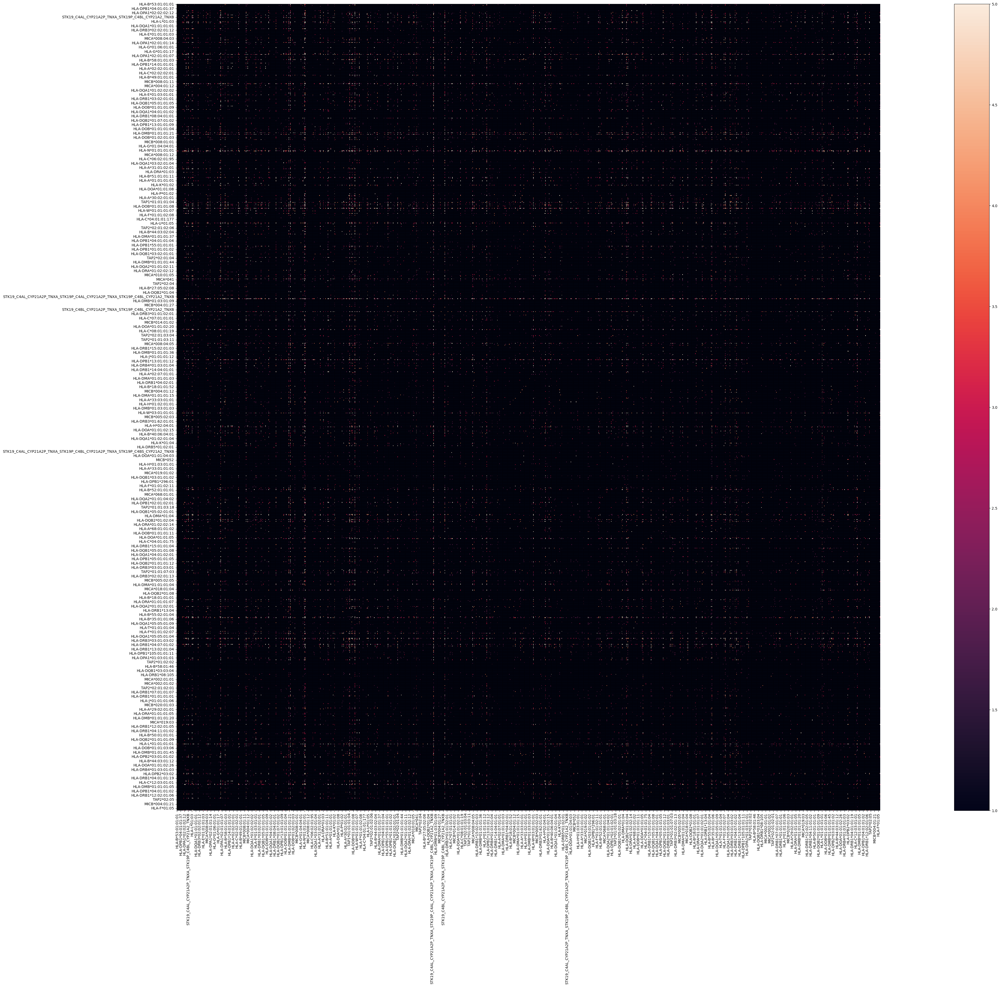

In [288]:
from matplotlib import rcParams
from matplotlib.patches import Rectangle
plt.rcParams.update(plt.rcParamsDefault)

fig, (ax, cax) = plt.subplots(nrows=1,ncols=2, figsize=(40,40),  gridspec_kw={"height_ratios":[1], 'width_ratios':[1,.05]})

#mytext=[['A']]
#sns.heatmap(sampleC4DF2, annot=textText, ax=ax, linewidths=.5, fmt="d", linecolor='black', cbar=False)

sns.heatmap(linkHeat, annot=False, ax=ax, linewidths=.5, fmt="d", linecolor='black', cbar=False,vmax=5, vmin=1)
#for ticklabel, tickcolor in zip(ax.get_yticklabels(), colors):
#    ticklabel.set_color(tickcolor)

fig.colorbar(ax.get_children()[0], cax=cax, orientation="vertical")
#ax.add_patch(Rectangle((0, 0), 1, 65, fill=False, edgecolor='yellow', lw=1))
#plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/C4_Totals.jpg', dpi=500, bbox_inches='tight')
#plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/C4_Totals.pdf', dpi=500, bbox_inches='tight')
#plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/C4_Totals.svg', dpi=500, bbox_inches='tight')

plt.show()
plt.show()

# Build Bar Plots

In [34]:
sampleRCCXCounts={}
for haplotype in sampleDictionary_Seq.keys():
    if 'chm13.hap1' == haplotype or 'hg38.hap1' == haplotype:
        continue
    else:
        if str(haplotype.split(".")[0]) in sampleRCCXCounts.keys():
            sampleRCCXCounts[str(haplotype.split(".")[0])].append('-'.join([x.split("C4")[1] for x in sampleDictionary_Seq[haplotype].split("_") if 'C4' in str(x)]))
            
        else:
            sampleRCCXCounts[str(haplotype.split(".")[0])]=[]
            sampleRCCXCounts[str(haplotype.split(".")[0])].append('-'.join([x.split("C4")[1] for x in sampleDictionary_Seq[haplotype].split("_") if 'C4' in str(x)]))


In [35]:
import seaborn as sns
sampleRCCXDiploids = []
for hap in sampleRCCXCounts.keys():
    stringg = ':'.join(sorted(sampleRCCXCounts[hap]))
    sampleRCCXDiploids.append(stringg)

In [36]:
RCCXDict = collections.Counter(sampleRCCXDiploids)
rccxList=[[x,int(y)/len(sampleRCCXDiploids)] for x,y in RCCXDict.items()]
rccxDF = pd.DataFrame(data=rccxList, columns=['C4 Diploid Combinations', 'Count'])
rccxDF2 = rccxDF.sort_values(by=['Count','C4 Diploid Combinations'], ascending=False)

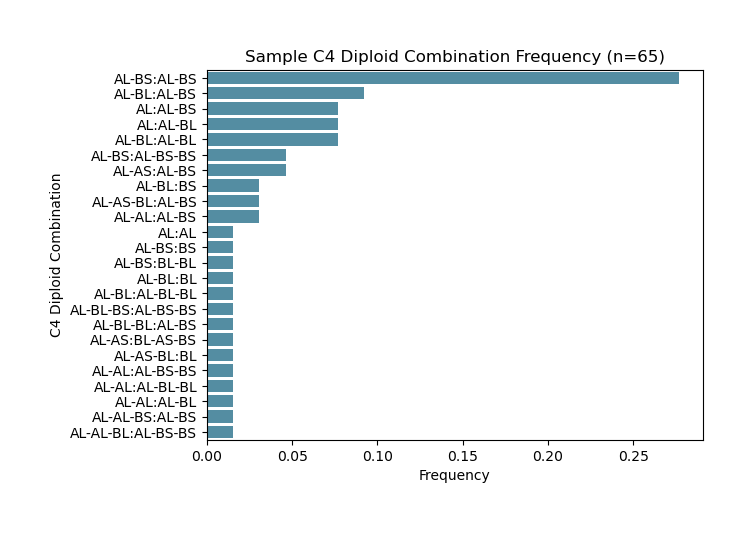

In [37]:
sns.barplot(rccxDF2, x='Count', y="C4 Diploid Combinations", color='#4793AF')
plt.xlabel("Frequency")
plt.ylabel("C4 Diploid Combination")
plt.title('Sample C4 Diploid Combination Frequency (n=65)')
#plt.xticks(rotation=90)
#plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Unique_C4_Diploid_Frequency.jpg', dpi=500, bbox_inches='tight')
#plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Unique_C4_Diploid_Frequency.pdf', dpi=500, bbox_inches='tight')
#plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Unique_C4_Diploid_Frequency.svg', dpi=500, bbox_inches='tight')
plt.show()

In [38]:
#Total C4 Genes
#Total L and Short Gene Versions
#Total C4A Genes
#Total C4B Genes
#- Break Down by population and by sex

In [39]:
sampleCounts={}
for haplotype in sampleDictionary_Seq.keys():
    if 'chm13.hap1' == haplotype or 'hg38.hap1' == haplotype:
        continue
    else:
        if str(haplotype.split(".")[0]) in sampleCounts.keys():
            geneList = [x for x in sampleDictionary_Seq[str(haplotype)].split("_") if 'C4' in str(x)]
            sampleCounts[str(haplotype.split(".")[0])]['Total C4']+=len(geneList)
            
            
            for gene in geneList:
                sampleCounts[str(haplotype.split(".")[0])][str(gene[:3])]+=1
                if 'L' in gene:
                    sampleCounts[str(haplotype.split(".")[0])]['C4L']+=1
                else:
                    sampleCounts[str(haplotype.split(".")[0])]['C4S']+=1
            
            
        else:
            sampleCounts[str(haplotype.split(".")[0])]={'Total C4':0, 'C4L':0, 'C4S':0, 'C4A':0, 'C4B':0}
            geneList = [x for x in sampleDictionary_Seq[str(haplotype)].split("_") if 'C4' in str(x)]
            sampleCounts[str(haplotype.split(".")[0])]['Total C4']+=len(geneList)
            
            
            for gene in geneList:
                sampleCounts[str(haplotype.split(".")[0])][str(gene[:3])]+=1
                if 'L' in gene:
                    sampleCounts[str(haplotype.split(".")[0])]['C4L']+=1
                else:
                    sampleCounts[str(haplotype.split(".")[0])]['C4S']+=1

In [40]:
sampleCounts

{'HG01890': {'Total C4': 4, 'C4L': 2, 'C4S': 2, 'C4A': 2, 'C4B': 2},
 'HG02554': {'Total C4': 4, 'C4L': 2, 'C4S': 2, 'C4A': 3, 'C4B': 1},
 'HG02011': {'Total C4': 3, 'C4L': 2, 'C4S': 1, 'C4A': 1, 'C4B': 2},
 'HG02282': {'Total C4': 4, 'C4L': 2, 'C4S': 2, 'C4A': 2, 'C4B': 2},
 'NA24385': {'Total C4': 4, 'C4L': 4, 'C4S': 0, 'C4A': 2, 'C4B': 2},
 'NA19705': {'Total C4': 3, 'C4L': 2, 'C4S': 1, 'C4A': 2, 'C4B': 1},
 'NA19983': {'Total C4': 4, 'C4L': 2, 'C4S': 2, 'C4A': 2, 'C4B': 2},
 'NA20355': {'Total C4': 3, 'C4L': 2, 'C4S': 1, 'C4A': 2, 'C4B': 1},
 'NA19836': {'Total C4': 4, 'C4L': 3, 'C4S': 1, 'C4A': 3, 'C4B': 1},
 'HG03009': {'Total C4': 4, 'C4L': 3, 'C4S': 1, 'C4A': 2, 'C4B': 2},
 'HG03807': {'Total C4': 4, 'C4L': 3, 'C4S': 1, 'C4A': 2, 'C4B': 2},
 'HG00864': {'Total C4': 5, 'C4L': 3, 'C4S': 2, 'C4A': 3, 'C4B': 2},
 'NA12329': {'Total C4': 4, 'C4L': 3, 'C4S': 1, 'C4A': 2, 'C4B': 2},
 'NA18534': {'Total C4': 3, 'C4L': 3, 'C4S': 0, 'C4A': 2, 'C4B': 1},
 'HG00514': {'Total C4': 4, 'C4L':

In [41]:
sampleC4DF = pd.DataFrame.from_dict(sampleCounts).T.copy()
sampleC4DF

,Total C4,C4L,C4S,C4A,C4B
HG01890,4,2,2,2,2
HG02554,4,2,2,3,1
HG02011,3,2,1,1,2
HG02282,4,2,2,2,2
NA24385,4,4,0,2,2
...,...,...,...,...,...
NA20509,4,2,2,2,2
NA19239,4,2,2,2,2
NA19129,3,2,1,2,1
NA19240,5,2,3,2,3


In [42]:
metaDataDF = pd.read_csv('/home/mark/Desktop/HLA/Globus/hgsvc_samples.tsv', sep='\t').set_index("sample")
metaDataDF

,order_num,hgsvc_phase,family,member,population,supergroup,sex
sample,,,,,,,
NA19238,1,Yr1,Y117,Mother,YRI,AFR,Female
NA19239,2,Yr1,Y117,Father,YRI,AFR,Male
NA19240,3,Yr1,Y117,Daughter,YRI,AFR,Female
HG00731,4,Yr1,PR05,Father,PUR,AMR,Male
HG00732,5,Yr1,PR05,Mother,PUR,AMR,Female
...,...,...,...,...,...,...,...
NA19384,65,Yr2,NA19384,-,LWK,AFR,Male
HG01890,66,Yr3,BB05,Father,ACB,AFRAMR,Male
NA19705,67,Yr3,2368,Son,ASW,AFRAMR,Male


In [43]:
PopColors={'AFR':'orange', 'AMR':'red', 'EAS':'limegreen', 'EUR':'cyan', 'SAS':'pink'}
populationColors={'ACB':'#FF9900',
 'ASW':'#FF6600',
 'ASK':'#1374DA',
 'BEB':'#8A008A',
 'CDX':'#339900',
 'CEU':'#0000FF',
 'CHB':'#ACCD00',
 'CHS':'#00FF00',
 'CLM':'#CC3333',
 'ESN':'#FFCD00',
 'FIN':'#00C5CD',
 'GBR':'#00EBFF',
 'GIH':'#9300D2',
 'GWD':'#FFB800',
 'IBS':'#6394EC',
 'ITU':'#AF2F5F',
 'JPT':'#008A00',
 'KHV':'#00CC33',
 'LWK':'#CC9933',
 'MKK':'#EEB718',
 'MSL':'#E0B818',
 'MXL':'#E00033',
 'PEL':'#FF0000',
 'PJL':'#E01288',
 'PUR':'#CC3300',
 'STU':'#FF00FF',
 'TSI':'#00008A',
 'YRI':'#FFB833'}

In [44]:
sampleOrder=['HG02587',
             'HG02666',
             'HG02769',
             'HG02818',
             'HG02953',
             'HG03065',
             'HG03248',
             'HG03371',
             'HG03452',
             'HG03456',
             'HG03520',
             'NA19036',
             'NA19129',
             'NA19238',
             'NA19239',
             'NA19240',
             'NA19317',
             'NA19331',
             'NA19347',
             'NA19384',
             'NA19434',
             'NA21487',
             'HG01890',
             'HG02011',
             'HG02282',
             'HG02554',
             'NA19705',
             'NA19836',
             'NA19983',
             'NA20355',
             'HG00731',
             'HG00732',
             'HG00733',
             'HG01114',
             'HG01352',
             'HG01457',
             'HG01573',
             'HG02106',
             'NA19650',
             'HG00512',
             'HG00513',
             'HG00514',
             'HG00864',
             'HG01596',
             'HG02018',
             'HG02059',
             'NA18534',
             'NA18939',
             'NA18989',
             'HG00096',
             'HG00171',
             'HG00268',
             'HG00358',
             'HG01505',
             'NA12329',
             'NA20509',
             'NA24385',
             'HG02492',
             'HG03009',
             'HG03683',
             'HG03732',
             'HG03807',
             'HG04036',
             'HG04217',
             'NA20847' 
            ]

In [45]:
sampleC4DF['SuperGroup'] = [metaDataDF.at[x,'supergroup'] for x in sampleC4DF.index]
sampleC4DF['population'] = [metaDataDF.at[x,'population'] for x in sampleC4DF.index]

In [46]:
test = sampleC4DF.loc[sampleOrder].copy()

In [47]:
sampleC4DF2 = test.drop(columns=['SuperGroup','population']).copy()

In [58]:
sum(test['C4L'])

172

In [59]:
sum(test['C4S'])

87

In [49]:
colors = []
for x in test.index:
    colors.append(populationColors[test.at[x,'population']])

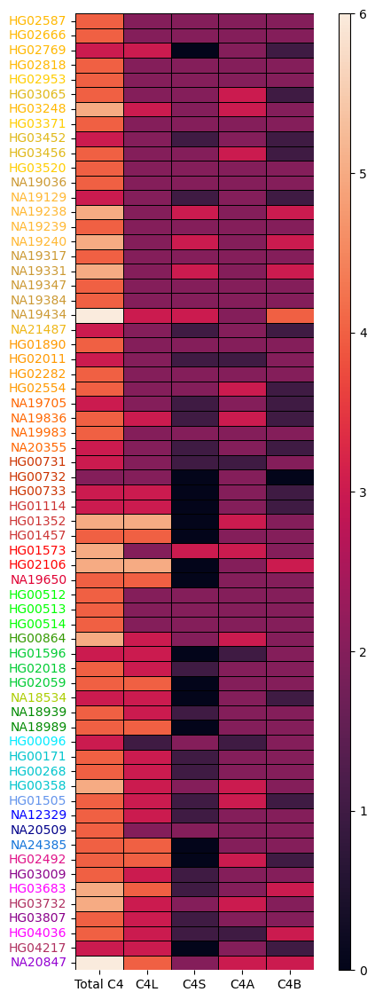

In [116]:
import seaborn as sns
from matplotlib import rcParams
from matplotlib.patches import Rectangle
plt.rcParams.update(plt.rcParamsDefault)

fig, (ax, cax) = plt.subplots(nrows=1,ncols=2, figsize=(4,14),  gridspec_kw={"height_ratios":[1], 'width_ratios':[1,.05]})

#mytext=[['A']]
#sns.heatmap(sampleC4DF2, annot=textText, ax=ax, linewidths=.5, fmt="d", linecolor='black', cbar=False)

sns.heatmap(sampleC4DF2, annot=False, ax=ax, linewidths=.5, fmt="d", linecolor='black', cbar=False)
for ticklabel, tickcolor in zip(ax.get_yticklabels(), colors):
    ticklabel.set_color(tickcolor)

fig.colorbar(ax.get_children()[0], cax=cax, orientation="vertical")
#ax.add_patch(Rectangle((0, 0), 1, 65, fill=False, edgecolor='yellow', lw=1))
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/C4_Totals.jpg', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/C4_Totals.pdf', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/C4_Totals.svg', dpi=500, bbox_inches='tight')

plt.show()
plt.show()

In [50]:
freqDF = pd.DataFrame(0.0, index=[0,1,2,3,4,5,6], columns=sampleC4DF2.columns)
freqDF

,Total C4,C4L,C4S,C4A,C4B
0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0


In [57]:
freqDF

,Total C4,C4L,C4S,C4A,C4B
0,0.000000,0.000000,0.230769,0.000000,0.015385
1,0.000000,0.015385,0.276923,0.076923,0.246154
2,0.015385,0.507692,0.415385,0.723077,0.615385
3,0.215385,0.323077,0.076923,0.200000,0.107692
4,0.569231,0.123077,0.000000,0.000000,0.015385
5,0.169231,0.030769,0.000000,0.000000,0.000000
6,0.030769,0.000000,0.000000,0.000000,0.000000


In [51]:
for column in sampleC4DF2.columns:
    countDict=collections.Counter(sampleC4DF2[column])
    for key in countDict.keys():
        freqDF.at[key, column]=int(countDict[key])/len(sampleC4DF2[column])

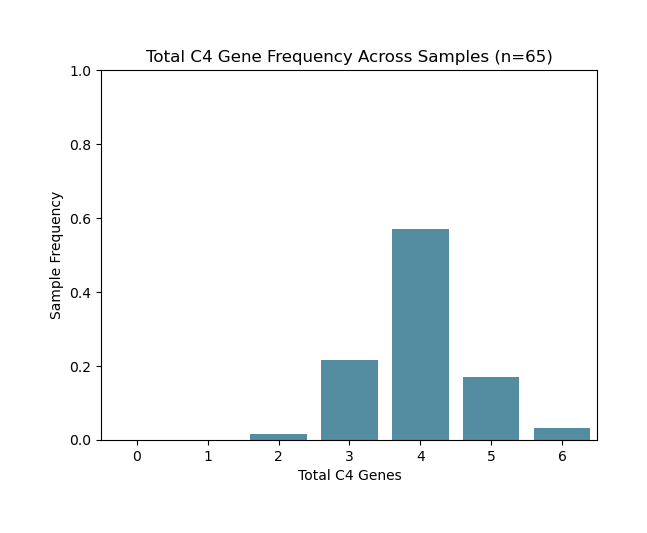

In [52]:
width = [.90,.90,.90,.90,.90]
ax=sns.barplot(freqDF, x=freqDF.index, y="Total C4", color='#4793AF')
ax.set_ylim([0.0, 1.0])
plt.ylabel("Sample Frequency")
plt.xlabel("Total C4 Genes")
plt.title('Total C4 Gene Frequency Across Samples (n=65)')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4_Frequency.jpg', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4_Frequency.pdf', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4_Frequency.svg', dpi=500, bbox_inches='tight')
plt.show()

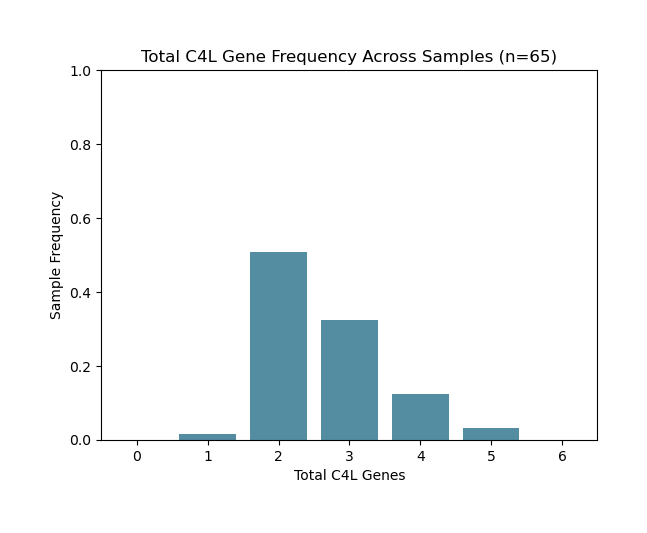

In [53]:
width = [.90,.90,.90,.90,.90]
ax= sns.barplot(freqDF, x=freqDF.index, y="C4L", color='#4793AF')
ax.set_ylim([0.0, 1.0])
plt.ylabel("Sample Frequency")
plt.xlabel("Total C4L Genes")
plt.title('Total C4L Gene Frequency Across Samples (n=65)')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4L_Frequency.jpg', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4L_Frequency.pdf', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4L_Frequency.svg', dpi=500, bbox_inches='tight')
plt.show()

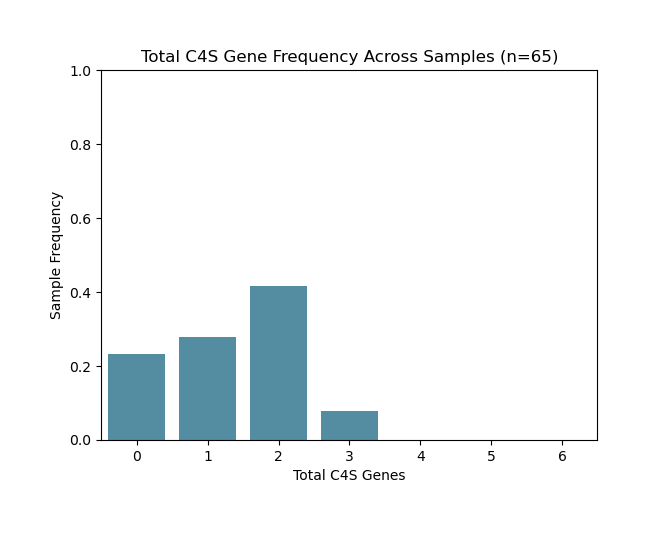

In [54]:
width = [.90,.90,.90,.90,.90]
ax=sns.barplot(freqDF, x=freqDF.index, y="C4S", color='#4793AF')
ax.set_ylim([0.0, 1.0])
plt.ylabel("Sample Frequency")
plt.xlabel("Total C4S Genes")
plt.title('Total C4S Gene Frequency Across Samples (n=65)')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4S_Frequency.jpg', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4S_Frequency.pdf', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4S_Frequency.svg', dpi=500, bbox_inches='tight')
plt.show()

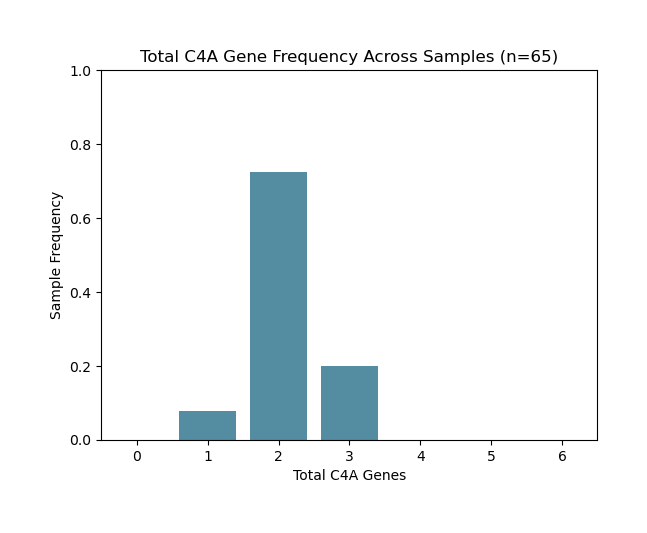

In [55]:
width = [.90,.90,.90,.90,.90]
ax=sns.barplot(freqDF, x=freqDF.index, y="C4A", color='#4793AF')
ax.set_ylim([0.0, 1.0])
plt.ylabel("Sample Frequency")
plt.xlabel("Total C4A Genes")
plt.title('Total C4A Gene Frequency Across Samples (n=65)')

plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4A_Frequency.jpg', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4A_Frequency.pdf', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4A_Frequency.svg', dpi=500, bbox_inches='tight')
plt.show()

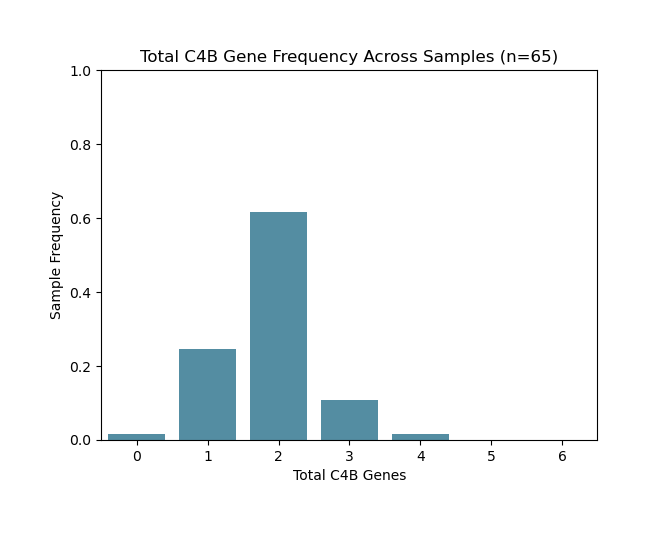

In [56]:
width = [.90,.90,.90,.90,.90]
ax=sns.barplot(freqDF, x=freqDF.index, y="C4B", color='#4793AF')
ax.set_ylim([0.0, 1.0])
plt.ylabel("Sample Frequency")
plt.xlabel("Total C4B Genes")
plt.title('Total C4B Gene Frequency Across Samples (n=65)')

plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4B_Frequency.jpg', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4B_Frequency.pdf', dpi=500, bbox_inches='tight')
plt.savefig('/home/mark/Desktop/HLA/C4_Master/Figures/Total_C4B_Frequency.svg', dpi=500, bbox_inches='tight')
plt.show()

## Visualize a different way

In [27]:
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from tqdm import tqdm

gv = GenomeViz(tick_style="axis")

for genome in sampleList3:
    if genome in genome_list.keys() and 'hap' in genome:
        print(genome)
        name, size, cds_list = genome_list[genome]["name"], genome_list[genome]["size"], genome_list[genome]["cds_list"]
        track = gv.add_feature_track(name, size)
        for idx, cds in tqdm(enumerate(cds_list, 1)):
            start, end, strand, mylabel, color  = cds
            #track.add_feature(start, end, strand, facecolor=color,linewidth=.2,labelrotation=0, labelvpos="top", labelhpos="center", labelha="center")
            #track.add_feature(start, end, strand, label=f"{mylabel}", linewidth=1, labelrotation=0, labelvpos="top", labelhpos="center", labelha="center")
            track.add_feature(start, end, strand, facecolor=color,labelrotation=0, plotstyle="box", labelvpos="top", labelhpos="center", labelha="center")
    else:
        continue
# Add Legends 
handles =[]
for color in ColorDict.keys():
    handles.append(Line2D([], [], marker=">", color=ColorDict[color], label=color, ms=10, ls="none"))

fig = gv.plotfig()
fig.subplots_adjust(wspace=0, hspace=1)
fig.legend(handles=handles, bbox_to_anchor=(1, 1))
fig.savefig("/home/mark/Desktop/C4_CYP21A2_Genome.svg")
#fig.savefig("/home/mark/Desktop/C4_CYP21A2_Genome.pdf")
#fig.savefig("/home/mark/Desktop/C4_CYP21A2_Genome.jpeg")

chm13.hap1


372it [00:00, 66567.73it/s]


hg38.hap1


373it [00:00, 66729.60it/s]


hg38.hap2


283it [00:00, 67661.63it/s]


HG01890.hap1


370it [00:00, 57945.35it/s]


HG01890.hap2


369it [00:00, 66679.51it/s]


HG02554.hap1


370it [00:00, 57537.17it/s]


HG02554.hap2


370it [00:00, 73040.55it/s]


HG02011.hap1


372it [00:00, 72855.86it/s]


HG02011.hap2


283it [00:00, 82521.41it/s]


HG02282.hap1


369it [00:00, 69662.79it/s]


HG02282.hap2


368it [00:00, 75721.34it/s]


NA19705.hap1


285it [00:00, 49915.51it/s]


NA19705.hap2


370it [00:00, 60519.15it/s]


NA19983.hap1


367it [00:00, 92108.04it/s]


NA19983.hap2


368it [00:00, 65538.78it/s]


NA20355.hap1


367it [00:00, 79304.98it/s]


NA20355.hap2


285it [00:00, 85985.95it/s]


NA19836.hap1


370it [00:00, 85296.94it/s]


NA19836.hap2


372it [00:00, 90466.81it/s]


NA24385.hap1


372it [00:00, 96272.05it/s]


NA24385.hap2


372it [00:00, 84467.36it/s]


HG03009.hap1


368it [00:00, 89785.58it/s]


HG03009.hap2


372it [00:00, 68352.44it/s]


HG03807.hap1


373it [00:00, 76457.60it/s]


HG03807.hap2


370it [00:00, 89907.45it/s]


HG00864.hap1


369it [00:00, 96797.68it/s]


HG00864.hap2


454it [00:00, 78754.87it/s]


NA12329.hap1


368it [00:00, 92982.16it/s]


NA12329.hap2


372it [00:00, 94803.81it/s]


NA18534.hap1


373it [00:00, 72661.53it/s]


NA18534.hap2


285it [00:00, 86483.62it/s]


HG00514.hap1


369it [00:00, 93834.01it/s]


HG00514.hap2


369it [00:00, 86396.01it/s]


HG00513.hap1


369it [00:00, 65040.27it/s]


HG00513.hap2


369it [00:00, 72846.57it/s]


HG00512.hap1


369it [00:00, 85080.43it/s]


HG00512.hap2


369it [00:00, 94487.07it/s]


HG01352.hap1


460it [00:00, 82969.80it/s]


HG01352.hap2


372it [00:00, 95249.44it/s]


HG01457.hap1


371it [00:00, 96699.40it/s]


HG01457.hap2


372it [00:00, 89784.85it/s]


HG01114.hap1


372it [00:00, 82137.35it/s]


HG01114.hap2


285it [00:00, 98807.79it/s]


HG03520.hap1


368it [00:00, 99690.23it/s]


HG03520.hap2


370it [00:00, 46958.74it/s]


HG03371.hap1


368it [00:00, 82394.91it/s]


HG03371.hap2


365it [00:00, 74018.32it/s]


HG02953.hap1


370it [00:00, 100452.62it/s]


HG02953.hap2


367it [00:00, 83178.95it/s]


HG00268.hap1


370it [00:00, 95654.12it/s]


HG00268.hap2


373it [00:00, 93412.67it/s]


HG00358.hap1


369it [00:00, 99543.23it/s]


HG00358.hap2


454it [00:00, 64249.07it/s]


HG00171.hap1


368it [00:00, 96048.78it/s]


HG00171.hap2


372it [00:00, 100120.71it/s]


HG00096.hap1


368it [00:00, 58703.98it/s]


HG00096.hap2


283it [00:00, 98998.17it/s]


NA20847.hap1


453it [00:00, 85332.78it/s]


NA20847.hap2


459it [00:00, 95880.55it/s]


HG02769.hap1


372it [00:00, 98137.06it/s]


HG02769.hap2


284it [00:00, 87119.31it/s]


HG03248.hap1


454it [00:00, 94464.43it/s]


HG03248.hap2


366it [00:00, 97177.65it/s]


HG02818.hap1


370it [00:00, 99684.77it/s]


HG02818.hap2


367it [00:00, 90568.93it/s]


HG02587.hap1


370it [00:00, 96348.95it/s]


HG02587.hap2


370it [00:00, 62060.80it/s]


HG02666.hap1


368it [00:00, 94300.09it/s]


HG02666.hap2


370it [00:00, 97254.65it/s]


HG01505.hap1


369it [00:00, 93556.08it/s]


HG01505.hap2


368it [00:00, 96886.82it/s]


HG03732.hap1


453it [00:00, 97567.00it/s]


HG03732.hap2


369it [00:00, 88596.84it/s]


HG04217.hap1


372it [00:00, 89702.26it/s]


HG04217.hap2


283it [00:00, 96456.04it/s]


NA18989.hap1


372it [00:00, 98428.03it/s]


NA18989.hap2


371it [00:00, 83422.87it/s]


NA18939.hap1


454it [00:00, 72085.63it/s]


NA18939.hap2


285it [00:00, 100595.53it/s]


HG01596.hap1


286it [00:00, 92831.68it/s]


HG01596.hap2


371it [00:00, 98937.36it/s]


HG02018.hap1


369it [00:00, 99806.42it/s]


HG02018.hap2


372it [00:00, 81087.26it/s]


HG02059.hap1


372it [00:00, 94214.18it/s]


HG02059.hap2


372it [00:00, 98124.71it/s]


NA19331.hap1


452it [00:00, 84938.41it/s]


NA19331.hap2


370it [00:00, 96787.61it/s]


NA19347.hap1


370it [00:00, 100674.18it/s]


NA19347.hap2


370it [00:00, 82184.64it/s]


NA19384.hap1


369it [00:00, 71431.12it/s]

NA19384.hap2



368it [00:00, 97597.46it/s]


NA19317.hap1


368it [00:00, 69718.77it/s]


NA19317.hap2


370it [00:00, 79751.91it/s]


NA19434.hap1


456it [00:00, 71211.65it/s]


NA19434.hap2


452it [00:00, 80570.57it/s]


NA19036.hap1


367it [00:00, 84517.08it/s]


NA19036.hap2


367it [00:00, 90393.42it/s]


NA21487.hap1


367it [00:00, 96666.01it/s]


NA21487.hap2


285it [00:00, 94758.35it/s]


HG03065.hap1


370it [00:00, 76159.03it/s]


HG03065.hap2


368it [00:00, 59749.31it/s]


HG03456.hap1


370it [00:00, 94975.06it/s]


HG03456.hap2


366it [00:00, 73559.60it/s]


HG03452.hap1


367it [00:00, 96008.83it/s]


HG03452.hap2


285it [00:00, 68739.31it/s]


NA19650.hap1


372it [00:00, 72507.14it/s]


NA19650.hap2


372it [00:00, 99090.63it/s]


HG01573.hap1


371it [00:00, 68601.45it/s]


HG01573.hap2


454it [00:00, 68659.91it/s]


HG02106.hap1


460it [00:00, 89022.28it/s]


HG02106.hap2


371it [00:00, 84675.78it/s]


HG02492.hap1


372it [00:00, 73838.49it/s]


HG02492.hap2


373it [00:00, 79873.15it/s]


HG00732.hap1


285it [00:00, 95385.94it/s]


HG00732.hap2


285it [00:00, 98922.26it/s]


HG00731.hap1


372it [00:00, 98415.61it/s]


HG00731.hap2


283it [00:00, 69859.81it/s]


HG00733.hap1


285it [00:00, 69750.07it/s]


HG00733.hap2


372it [00:00, 75009.91it/s]


HG03683.hap1


460it [00:00, 85080.91it/s]


HG03683.hap2


368it [00:00, 97578.95it/s]


HG04036.hap1


373it [00:00, 84342.84it/s]


HG04036.hap2


367it [00:00, 85645.67it/s]


NA20509.hap1


368it [00:00, 65041.67it/s]


NA20509.hap2


368it [00:00, 57569.80it/s]


NA19239.hap1


368it [00:00, 93585.39it/s]


NA19239.hap2


370it [00:00, 93358.15it/s]


NA19129.hap1


285it [00:00, 67046.76it/s]


NA19129.hap2


370it [00:00, 68149.15it/s]


NA19240.hap1


370it [00:00, 82067.29it/s]


NA19240.hap2


453it [00:00, 88364.79it/s]


NA19238.hap1


453it [00:00, 63735.52it/s]


NA19238.hap2


367it [00:00, 84318.01it/s]
